In [6]:
%matplotlib notebook

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
sns.set_style('ticks')


import xml.etree.ElementTree as et
import os
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer


import scipy as sp
from scipy import sparse
import sklearn
from sklearn.decomposition import TruncatedSVD

from openTSNE import TSNE
from openTSNE import affinity, initialization, TSNEEmbedding

from openTSNE.affinity import Affinities
from annoy import AnnoyIndex

import time

import pickle

from scipy.stats import gaussian_kde

import memory_profiler
%load_ext memory_profiler

from pathlib import Path

The memory_profiler extension is already loaded. To reload it, use:
  %reload_ext memory_profiler


In [7]:
#variables_path = Path('../variables')
#figures_path = Path('../results/figures')
#berenslab_data_path = Path('/gpfs01/berens/data/data/pubmed_processed')

In [8]:
variables_path = Path("../results/variables")
figures_path = Path("../results/figures")
berenslab_data_path = Path(
    "/gpfs01/berens/data/data/pubmed_processed/embeddings/embeddings_luca"
)

In [9]:
sklearn.__version__

'1.0.2'

In [12]:
plt.style.use("matplotlib_style.txt")

# Eliminated covid keywords features

Keywords: `covid`,`19`, `coronavirus`, `sars`, `cov`, `2019`

In [21]:
# load
# TF-IDF features
tfidf_features_updated_reparsed = sp.sparse.load_npz(variables_path / "tfidf_features_updated_reparsed.npz")

# voc
pickle_in = open(variables_path / "vocabulary_updated_reparsed.pkl","rb")
vocabulary_updated_reparsed = pickle.load(pickle_in)

tcmalloc: large alloc 18038185984 bytes == 0x9c41e000 @ 
tcmalloc: large alloc 18038185984 bytes == 0x4dcbf0000 @ 


In [19]:
cols_to_delete = [vocabulary_updated_reparsed['covid'],
                  vocabulary_updated_reparsed['19'],
                  vocabulary_updated_reparsed['coronavirus'],
                  vocabulary_updated_reparsed['sars'],
                  vocabulary_updated_reparsed['cov'],
                  vocabulary_updated_reparsed['2019']]

cols_to_delete

[1171878, 115809, 1162002, 3850104, 1171346, 139641]

In [23]:
%%memit
all_cols = np.arange(tfidf_features_updated_reparsed.shape[1])
cols_to_keep = np.where(np.logical_not(np.in1d(all_cols, cols_to_delete)))[0]

peak memory: 36809.61 MiB, increment: 0.01 MiB


In [24]:
tfidf_features_without_covid = tfidf_features_updated_reparsed[:, cols_to_keep]

In [25]:
print(tfidf_features_updated_reparsed.shape)
print(tfidf_features_without_covid.shape)

(20687150, 4679130)
(20687150, 4679124)


In [26]:
#save results
sp.sparse.save_npz(variables_path / "tfidf_features_without_covid", tfidf_features_without_covid)

In [2]:
#  results
tfidf_features_without_covid = sp.sparse.load_npz(variables_path / "tfidf_features_without_covid.npz")

## Truncated SVD

In [ ]:
%%time
%%memit

#TruncatedSVD
svd = TruncatedSVD(n_components=300,random_state=42,algorithm='arpack')
svd_data_without_covid=svd.fit_transform(tfidf_features_without_covid)

# save results
np.save(variables_path / "svd_data_without_covid",svd_data_without_covid)

In [8]:
svd_data_without_covid.shape

(20687150, 300)

## t-SNE
Annealing exgg=1, n_iter=2000 

In [2]:
svd_data_without_covid = np.load(variables_path / "svd_data_without_covid.npy")

### Affinities

In [3]:
%%time
%%memit

A = affinity.Uniform(svd_data_without_covid, k_neighbors=10, n_jobs=-1, verbose=1, random_state=42)

===> Finding 10 nearest neighbors using Annoy approximate search using euclidean distance...


tcmalloc: large alloc 1275691008 bytes == 0xbd1e78000 @ 
tcmalloc: large alloc 1658404864 bytes == 0xc1df10000 @ 
tcmalloc: large alloc 2155921408 bytes == 0xb976a0000 @ 
tcmalloc: large alloc 2802704384 bytes == 0xc17eac000 @ 
tcmalloc: large alloc 3643514880 bytes == 0xd2b838000 @ 
tcmalloc: large alloc 4736565248 bytes == 0xb976a0000 @ 
tcmalloc: large alloc 6157533184 bytes == 0xe052f2000 @ 
tcmalloc: large alloc 8004788224 bytes == 0xf7433a000 @ 
tcmalloc: large alloc 10406232064 bytes == 0xb976a0000 @ 
tcmalloc: large alloc 13528096768 bytes == 0xe052f2000 @ 
tcmalloc: large alloc 17586528256 bytes == 0x1151d30000 @ 
tcmalloc: large alloc 22862487552 bytes == 0x156b102000 @ 
tcmalloc: large alloc 29721231360 bytes == 0x1abf460000 @ 
tcmalloc: large alloc 38637600768 bytes == 0x21accc0000 @ 


   --> Time elapsed: 4595.20 seconds
peak memory: 147630.91 MiB, increment: 99961.00 MiB
CPU times: user 11h 34min 41s, sys: 20min 17s, total: 11h 54min 59s
Wall time: 1h 17min 32s


In [ ]:
#save results
sp.sparse.save_npz(variables_path / "affinities_P_tfidf_without_covid", A.P)

In [3]:
# load affinities P
affinities_P_tfidf_without_covid = sp.sparse.load_npz(variables_path / "affinities_P_tfidf_without_covid.npz")

In [4]:
# create the affinities object
from openTSNE.affinity import Affinities

A = Affinities()
A.P = affinities_P_tfidf_without_covid

### Initialization

In [3]:
%%time
%%memit

I = initialization.pca(svd_data_without_covid, random_state=42)

np.save(variables_path / "initialization_tfidf_without_covid", I)

peak memory: 147901.62 MiB, increment: 100145.20 MiB
CPU times: user 20min 28s, sys: 11min 13s, total: 31min 41s
Wall time: 2min 43s


In [5]:
I=np.load(variables_path / "initialization_tfidf_without_covid.npy")

#### Plot PCA components

In [8]:
mask_covid = np.load(variables_path / 'mask_reparsed_covid.npy')

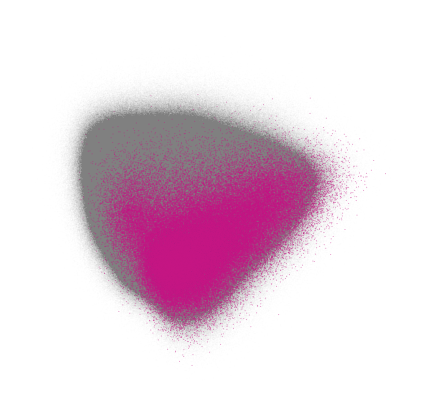

In [10]:
%matplotlib inline 
pca=I_without_covid
subregion=pca[mask_covid]

fig=plt.figure(figsize=(2.5, 2.5), dpi=200)
plt.scatter(pca[:,0],pca[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
plt.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
plt.axis('equal')
#plt.xlim(left=-200)
#plt.ylim(-200,200)
plt.grid()
plt.xticks([])
plt.yticks([])
sns.despine(bottom=True, left=True)

plt.savefig(figures_path / "pca_init_without_covid.png", bbox_inches='tight')

#### with all the features (unaltered data)

In [14]:
initialization_tfidf_reparsed=np.load(variables_path / "initialization_tfidf_reparsed.npy")

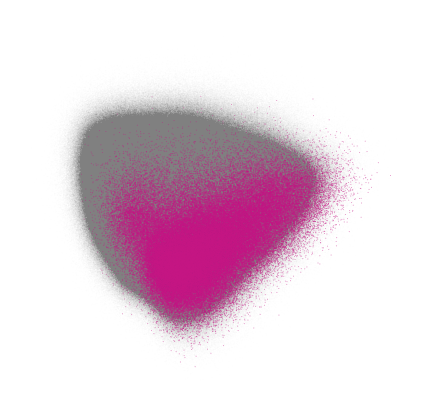

In [15]:
%matplotlib inline 
pca=initialization_tfidf_reparsed
subregion=pca[mask_covid]

fig=plt.figure(figsize=(2.5, 2.5), dpi=200)
plt.scatter(pca[:,0],pca[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
plt.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
plt.axis('equal')
#plt.xlim(left=-200)
#plt.ylim(-200,200)
plt.grid()
plt.xticks([])
plt.yticks([])
sns.despine(bottom=True, left=True)

plt.savefig(figures_path / "pca_init_tfidf_reparsed.png", bbox_inches='tight')

### Optimization

In [6]:
Zs = []
kls = []
n_iter = []

def mycallback(iteration, error, embedding):
    Zs.append(embedding.copy())
    kls.append(error)
    n_iter.append(iteration)

In [ ]:
%%capture cap

E = TSNEEmbedding(I, A, n_jobs=-1, random_state=42, verbose=True)

# early exaggeration
E = E.optimize(n_iter=125, exaggeration=12, momentum=0.5, n_jobs=-1, verbose=True, callbacks=mycallback, callbacks_every_iters=50)

# exaggeration annealing
exs = np.linspace(12,1,125)
for i in range(125):
    if (i+1)%50 == 0:
        E = E.optimize(n_iter=1, exaggeration=exs[i], momentum=0.8, n_jobs=-1, verbose=True, callbacks=mycallback, callbacks_every_iters=1)
        
    else:
        E = E.optimize(n_iter=1, exaggeration=exs[i], momentum=0.8, n_jobs=-1, verbose=True)
    
# final optimization without exaggeration
E = E.optimize(n_iter=2000, exaggeration=1, momentum=0.8, n_jobs=-1, verbose=True, callbacks=mycallback, callbacks_every_iters=50)

In [ ]:
with open(variables_path / 'verbose_tsne_tfidf_without_covid.txt', 'w') as f:
    f.write(cap.stdout)

In [ ]:
Zs_array=[]
for i in np.arange(len(Zs)):
    Zs_array.append(np.array(Zs[i]))

In [ ]:
#save results
f = open(variables_path / "Zs_array_tfidf_without_covid.pkl","wb")
pickle.dump(Zs_array,f)
f.close()

In [ ]:
#load
# pickle_in = open(variables_path / "Zs_array_tfidf_without_covid.pkl","rb")
# Zs_array = pickle.load(pickle_in)

In [ ]:
#save iter
f = open(variables_path / "iterations_tfidf_without_covid.pkl","wb")
pickle.dump(n_iter,f)
f.close()

In [ ]:
# #load
# pickle_in = open(variables_path / "iterations.pkl","rb")
# iterations = pickle.load(pickle_in)

In [ ]:
#save kl divergence
f = open(variables_path / "kl_divergence_tfidf_without_covid.pkl","wb")
pickle.dump(kls,f)
f.close()

In [ ]:
# #load
# pickle_in = open(variables_path / "kl_divergence.pkl","rb")
# kls = pickle.load(pickle_in)

In [ ]:
tsne_tfidf_without_covid=np.array(E)

#save
np.save(variables_path / "tsne_tfidf_without_covid", tsne_tfidf_without_covid)

In [10]:
tsne_tfidf_without_covid=np.load(variables_path / "tsne_tfidf_without_covid.npy")

In [11]:
tsne_tfidf_without_covid.shape

(20687150, 2)

## Plot

In [13]:
mask_covid_2 = np.load(variables_path / "mask_covid_2.npy")

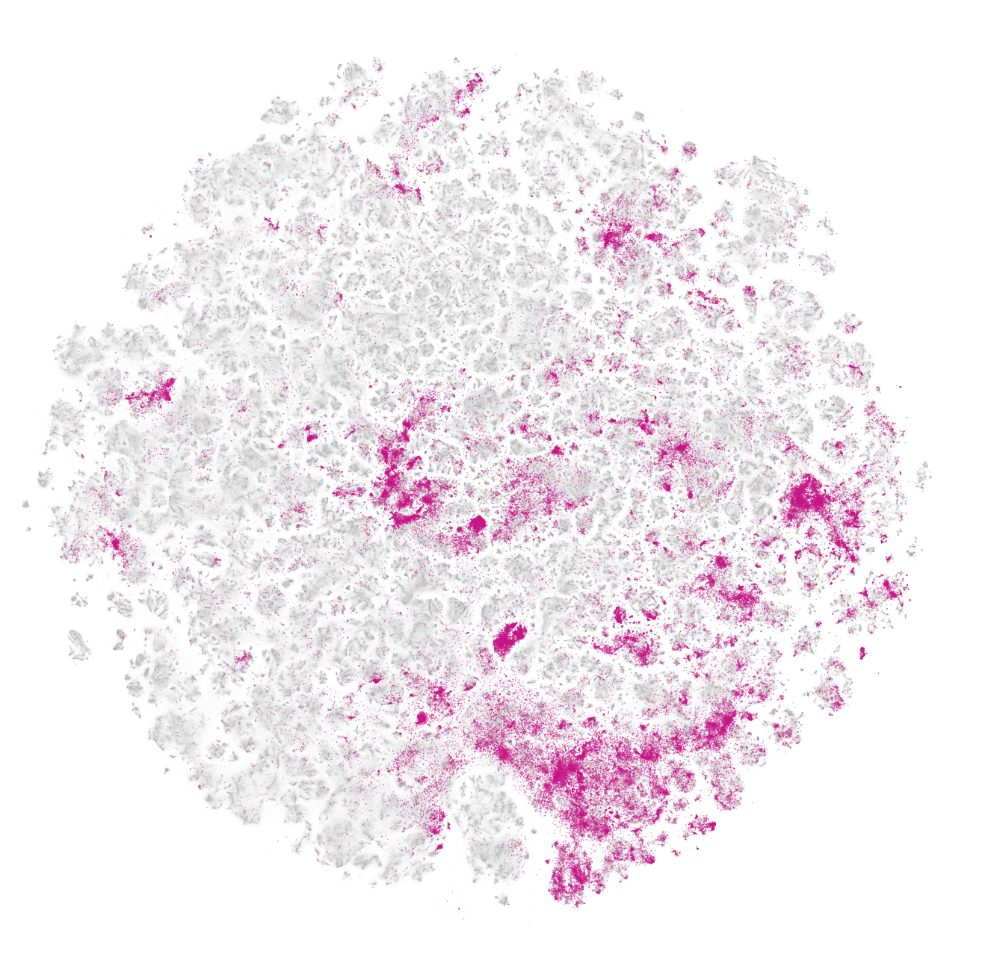

In [15]:
%matplotlib inline 
tsne=tsne_tfidf_without_covid
subregion=tsne[mask_covid_2]

fig, ax=plt.subplots(figsize=(5.5, 5.5), dpi=300)
ax.scatter(tsne[:,0],tsne[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
ax.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
ax.axis('equal')
ax.set_xlim(left=-200)
ax.set_ylim(-200,200)
ax.axis('off')

fig.savefig(figures_path / "tsne_tfidf_reparsed_without_covid_covid.png")

# Eliminated `covid` feature

In [6]:
#  results
tfidf_features_updated_reparsed = sp.sparse.load_npz(variables_path / "tfidf_features_updated_reparsed.npz")

In [3]:
# voc
pickle_in = open(variables_path / "vocabulary_updated_reparsed.pkl","rb")
vocabulary_updated_reparsed = pickle.load(pickle_in)

In [4]:
cols_to_delete = [vocabulary_updated_reparsed['covid']
                  ]

cols_to_delete

[1171878]

In [7]:
%%memit
all_cols = np.arange(tfidf_features_updated_reparsed.shape[1])
cols_to_keep = np.where(np.logical_not(np.in1d(all_cols, cols_to_delete)))[0]

peak memory: 35561.30 MiB, increment: 117.32 MiB


In [8]:
tfidf_features_without_covid_only = tfidf_features_updated_reparsed[:, cols_to_keep]

In [9]:
print(tfidf_features_updated_reparsed.shape)
print(tfidf_features_without_covid_only.shape)

(20687150, 4679130)
(20687150, 4679129)


In [10]:
#save results
sp.sparse.save_npz(variables_path / "tfidf_features_without_covid_only", tfidf_features_without_covid_only)

In [2]:
#  results
tfidf_features_without_covid_only = sp.sparse.load_npz(variables_path / "tfidf_features_without_covid_only.npz")

## Truncated SVD

In [ ]:
%%time
%%memit

#TruncatedSVD
svd = TruncatedSVD(n_components=300,random_state=42,algorithm='arpack')
svd_data_without_covid_only=svd.fit_transform(tfidf_features_without_covid_only)

# save results
np.save(variables_path / "svd_data_without_covid_only",svd_data_without_covid_only)

In [ ]:
svd_data_without_covid_only.shape

## t-SNE
Annealing exgg=1, n_iter=2000 

In [2]:
svd_data_without_covid_only = np.load(variables_path / "svd_data_without_covid_only.npy")

### Affinities

In [ ]:
%%time
%%memit

A = affinity.Uniform(svd_data_without_covid_only, k_neighbors=10, n_jobs=-1, verbose=1, random_state=42)

===> Finding 10 nearest neighbors using Annoy approximate search using euclidean distance...


In [ ]:
#save results
sp.sparse.save_npz(variables_path / "affinities_P_tfidf_without_covid_only", A.P)

In [2]:
# load affinities P
affinities_P_tfidf_without_covid_only = sp.sparse.load_npz(variables_path / "affinities_P_tfidf_without_covid_only.npz")

In [3]:
# create the affinities object
from openTSNE.affinity import Affinities

A = Affinities()
A.P = affinities_P_tfidf_without_covid_only

### Initialization

In [3]:
%%time
%%memit

I = initialization.pca(svd_data_without_covid_only, random_state=42)

np.save(variables_path / "initialization_tfidf_without_covid_only", I)

peak memory: 147874.22 MiB, increment: 100117.74 MiB
CPU times: user 19min 2s, sys: 13min 36s, total: 32min 39s
Wall time: 3min


In [4]:
I=np.load(variables_path / "initialization_tfidf_without_covid.npy")

#### Plot PCA components

In [8]:
#mask_covid = np.load(variables_path / 'mask_reparsed_covid.npy')

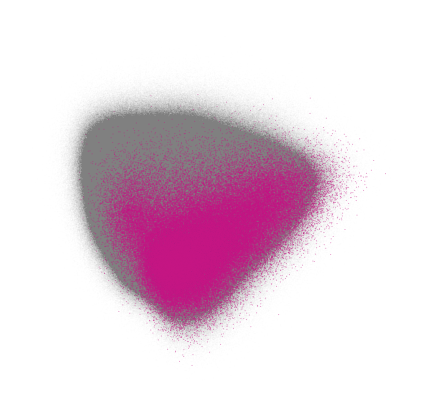

In [13]:
%matplotlib inline 
pca=I_without_covid_only
subregion=pca[mask_covid]

fig=plt.figure(figsize=(2.5, 2.5), dpi=200)
plt.scatter(pca[:,0],pca[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
plt.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
plt.axis('equal')
#plt.xlim(left=-200)
#plt.ylim(-200,200)
plt.grid()
plt.xticks([])
plt.yticks([])
sns.despine(bottom=True, left=True)

plt.savefig(figures_path / "pca_init_without_covid_only.png", bbox_inches='tight')

### Optimization

In [5]:
Zs = []
kls = []
n_iter = []

def mycallback(iteration, error, embedding):
    Zs.append(embedding.copy())
    kls.append(error)
    n_iter.append(iteration)

In [6]:
%%capture cap

E = TSNEEmbedding(I, A, n_jobs=-1, random_state=42, verbose=True)

# early exaggeration
E = E.optimize(n_iter=125, exaggeration=12, momentum=0.5, n_jobs=-1, verbose=True, callbacks=mycallback, callbacks_every_iters=50)

# exaggeration annealing
exs = np.linspace(12,1,125)
for i in range(125):
    if (i+1)%50 == 0:
        E = E.optimize(n_iter=1, exaggeration=exs[i], momentum=0.8, n_jobs=-1, verbose=True, callbacks=mycallback, callbacks_every_iters=1)
        
    else:
        E = E.optimize(n_iter=1, exaggeration=exs[i], momentum=0.8, n_jobs=-1, verbose=True)
    
# final optimization without exaggeration
E = E.optimize(n_iter=2000, exaggeration=1, momentum=0.8, n_jobs=-1, verbose=True, callbacks=mycallback, callbacks_every_iters=50)

In [7]:
with open(variables_path / 'verbose_tsne_tfidf_without_covid_only.txt', 'w') as f:
    f.write(cap.stdout)

In [8]:
Zs_array=[]
for i in np.arange(len(Zs)):
    Zs_array.append(np.array(Zs[i]))

In [9]:
#save results
f = open(variables_path / "Zs_array_tfidf_without_covid_only.pkl","wb")
pickle.dump(Zs_array,f)
f.close()

In [10]:
#load
# pickle_in = open(variables_path / "Zs_array_tfidf_without_covid_only.pkl","rb")
# Zs_array = pickle.load(pickle_in)

In [11]:
#save iter
f = open(variables_path / "iterations_tfidf_without_covid_only.pkl","wb")
pickle.dump(n_iter,f)
f.close()

In [12]:
#save kl divergence
f = open(variables_path / "kl_divergence_tfidf_without_covid_only.pkl","wb")
pickle.dump(kls,f)
f.close()

In [13]:
tsne_tfidf_without_covid_only=np.array(E)

#save
np.save(variables_path / "tsne_tfidf_without_covid_only", tsne_tfidf_without_covid_only)

In [16]:
tsne_tfidf_without_covid_only=np.load(variables_path / "tsne_tfidf_without_covid_only.npy")

## Plot

In [13]:
mask_covid_2 = np.load(variables_path / "mask_covid_2.npy")

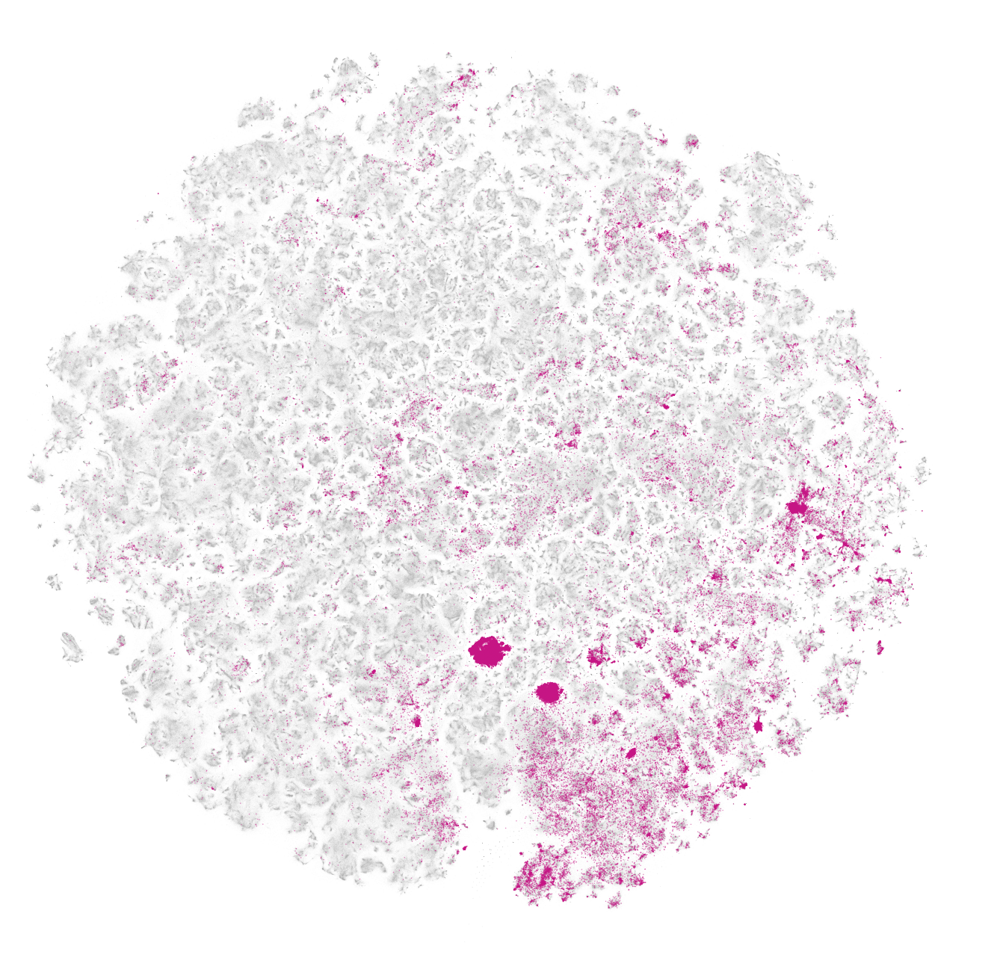

In [17]:
%matplotlib inline 
tsne=tsne_tfidf_without_covid_only
subregion=tsne[mask_covid_2]

fig, ax=plt.subplots(figsize=(5.5, 5.5), dpi=300)
ax.scatter(tsne[:,0],tsne[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
ax.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
ax.axis('equal')
ax.set_xlim(left=-200)
ax.set_ylim(-200,200)
ax.axis('off')

fig.savefig(figures_path / "tsne_tfidf_reparsed_without_covid_only_covid.png")

# Shuffling covid keywords features

Keywords: `covid`,`19`, `coronavirus`, `sars`, `cov`, `2019`

In [40]:
#  results
tfidf_features_updated_reparsed = sp.sparse.load_npz(variables_path / "tfidf_features_updated_reparsed.npz")

tcmalloc: large alloc 18038185984 bytes == 0x47d4412000 @ 
tcmalloc: large alloc 18038185984 bytes == 0x27aea1e000 @ 


In [24]:
# voc
pickle_in = open(variables_path / "vocabulary_updated_reparsed.pkl","rb")
vocabulary_updated_reparsed = pickle.load(pickle_in)

In [13]:
cols_to_delete = [vocabulary_updated_reparsed['covid'],
                  vocabulary_updated_reparsed['19'],
                  vocabulary_updated_reparsed['coronavirus'],
                  vocabulary_updated_reparsed['sars'],
                  vocabulary_updated_reparsed['cov'],
                  vocabulary_updated_reparsed['2019']]

cols_to_delete

[1171878, 115809, 1162002, 3850104, 1171346, 139641]

In [14]:
# shuffle keywords

np.random.seed(42)
reorder = np.random.permutation(tfidf_features_updated_reparsed.shape[0])

tfidf_features_lil_matrix = sparse.lil_matrix(tfidf_features_updated_reparsed)

tfidf_features_lil_matrix[:, cols_to_delete] = tfidf_features_lil_matrix[:, cols_to_delete][reorder]

tfidf_features_covid_keywords_shuffled = sparse.csr_matrix(tfidf_features_lil_matrix)

In [15]:
print(tfidf_features_updated_reparsed.shape)
print(tfidf_features_covid_keywords_shuffled.shape)

(20687150, 4679130)
(20687150, 4679130)


In [16]:
#save results
sp.sparse.save_npz(variables_path / "tfidf_features_covid_keywords_shuffled", tfidf_features_covid_keywords_shuffled)

In [35]:
#  results
tfidf_features_covid_keywords_shuffled = sp.sparse.load_npz(variables_path / "tfidf_features_covid_keywords_shuffled.npz")

tcmalloc: large alloc 18038185984 bytes == 0x1b6ce60000 @ 
tcmalloc: large alloc 18038185984 bytes == 0x20c11be000 @ 


## Truncated SVD

In [3]:
%%time
%%memit

#TruncatedSVD
svd = TruncatedSVD(n_components=300,random_state=42,algorithm='arpack')
svd_data_covid_keywords_shuffled=svd.fit_transform(tfidf_features_covid_keywords_shuffled)

# save results
np.save(variables_path / "svd_data_covid_keywords_shuffled",svd_data_covid_keywords_shuffled)

tcmalloc: large alloc 22497263616 bytes == 0x87bc82000 @ 
tcmalloc: large alloc 22497263616 bytes == 0xdc1278000 @ 
tcmalloc: large alloc 18038185984 bytes == 0x885a58000 @ 
tcmalloc: large alloc 18038185984 bytes == 0x12ff188000 @ 
tcmalloc: large alloc 11229913088 bytes == 0x1733416000 @ 
tcmalloc: large alloc 11229913088 bytes == 0xdba492000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x19d19c4000 @ 
tcmalloc: large alloc 11229913088 bytes == 0x1057a40000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x25636e6000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x19d19c4000 @ 
tcmalloc: large alloc 11229913088 bytes == 0x1057a40000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x30f5c08000 @ 
tcmalloc: large alloc 11229913088 bytes == 0x19d19c4000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x25636e6000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x25636e6000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x3c8812a000 @ 


peak memory: 243830.70 MiB, increment: 208950.95 MiB
CPU times: user 23h 58min 44s, sys: 3h 13min 31s, total: 1d 3h 12min 16s
Wall time: 8h 4min 10s


In [4]:
svd_data_covid_keywords_shuffled.shape

(20687150, 300)

## t-SNE
Annealing exgg=1, n_iter=2000 

In [2]:
svd_data_covid_keywords_shuffled = np.load(variables_path / "svd_data_covid_keywords_shuffled.npy")

tcmalloc: large alloc 49649164288 bytes == 0x5d16000 @ 


### Affinities

In [3]:
%%time
%%memit

A = affinity.Uniform(svd_data_covid_keywords_shuffled, k_neighbors=10, n_jobs=-1, verbose=1, random_state=42)

===> Finding 10 nearest neighbors using Annoy approximate search using euclidean distance...


tcmalloc: large alloc 1275691008 bytes == 0xbffa6c000 @ 
tcmalloc: large alloc 1658404864 bytes == 0xb982b2000 @ 
tcmalloc: large alloc 2155921408 bytes == 0xbfb046000 @ 
tcmalloc: large alloc 2802704384 bytes == 0xc7b852000 @ 
tcmalloc: large alloc 3643514880 bytes == 0xd99c08000 @ 
tcmalloc: large alloc 4736565248 bytes == 0xbfb046000 @ 
tcmalloc: large alloc 6157533184 bytes == 0xd99c08000 @ 
tcmalloc: large alloc 8004788224 bytes == 0xfe270a000 @ 
tcmalloc: large alloc 10406232064 bytes == 0x11c0100000 @ 
tcmalloc: large alloc 13528096768 bytes == 0x142cd28000 @ 
tcmalloc: large alloc 17586528256 bytes == 0x1753a8e000 @ 
tcmalloc: large alloc 22862487552 bytes == 0x1b6ce60000 @ 
tcmalloc: large alloc 29721231360 bytes == 0x20c11be000 @ 
tcmalloc: large alloc 38637600768 bytes == 0x27aea1e000 @ 


   --> Time elapsed: 4693.16 seconds
peak memory: 132536.85 MiB, increment: 84860.98 MiB
CPU times: user 11h 46min 35s, sys: 20min 21s, total: 12h 6min 57s
Wall time: 1h 19min 12s


In [ ]:
#save results
sp.sparse.save_npz(variables_path / "affinities_P_tfidf_covid_keywords_shuffled", A.P)

In [3]:
# load affinities P
affinities_P_tfidf_covid_keywords_shuffled = sp.sparse.load_npz(variables_path / "affinities_P_tfidf_covid_keywords_shuffled.npz")

In [4]:
# create the affinities object
from openTSNE.affinity import Affinities

A = Affinities()
A.P = affinities_P_tfidf_covid_keywords_shuffled

### Initialization

In [5]:
%%time
%%memit

I = initialization.pca(svd_data_covid_keywords_shuffled, random_state=42)

np.save(variables_path / "initialization_covid_keywords_shuffled", I)

tcmalloc: large alloc 49649164288 bytes == 0x30b01ce000 @ 
tcmalloc: large alloc 49649164288 bytes == 0x3c41ef0000 @ 


peak memory: 150153.46 MiB, increment: 31752.66 MiB
CPU times: user 51min 26s, sys: 12min 59s, total: 1h 4min 26s
Wall time: 3min 41s


In [5]:
I=np.load(variables_path / "initialization_covid_keywords_shuffled.npy")

### Optimization

In [ ]:
%%capture cap

E = TSNEEmbedding(I, A, n_jobs=-1, random_state=42, verbose=True)

# early exaggeration
E = E.optimize(n_iter=125, exaggeration=12, momentum=0.5, n_jobs=-1, verbose=True)#, callbacks=mycallback, callbacks_every_iters=50)

# exaggeration annealing
exs = np.linspace(12,1,125)
for i in range(125):
    E = E.optimize(n_iter=1, exaggeration=exs[i], momentum=0.8, n_jobs=-1, verbose=True)#, callbacks=mycallback, callbacks_every_iters=1)
    
# final optimization without exaggeration
E = E.optimize(n_iter=2000, exaggeration=1, momentum=0.8, n_jobs=-1, verbose=True)#, callbacks=mycallback, callbacks_every_iters=50)

In [ ]:
with open(variables_path / 'verbose_tsne_tfidf_covid_keywords_shuffled.txt', 'w') as f:
    f.write(cap.stdout)

In [ ]:
tsne_tfidf_covid_keywords_shuffled=np.array(E)

#save
np.save(variables_path / "tsne_tfidf_covid_keywords_shuffled", tsne_tfidf_covid_keywords_shuffled)

In [18]:
tsne_tfidf_covid_keywords_shuffled=np.load(variables_path / "tsne_tfidf_covid_keywords_shuffled.npy")

In [19]:
tsne_tfidf_covid_keywords_shuffled.shape

(20687150, 2)

## Covid plot: REPEAT (3)

In [13]:
mask_covid_2 = np.load(variables_path / "mask_covid_2.npy")

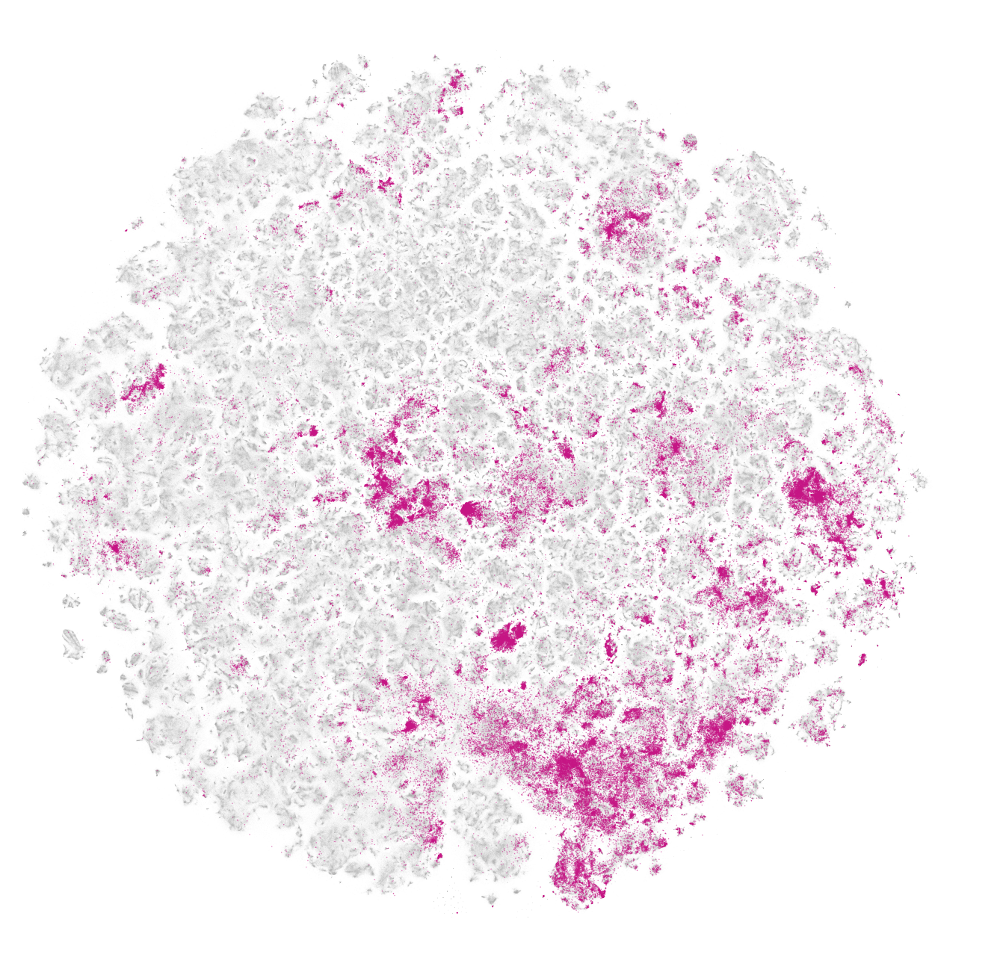

In [22]:
%matplotlib inline 
np.random.seed(42)
reorder = np.random.permutation(tsne_tfidf_covid_keywords_shuffled.shape[0])
tsne=tsne_tfidf_covid_keywords_shuffled
subregion=tsne[mask_covid_2]

fig, ax=plt.subplots(figsize=(5.5, 5.5), dpi=300)
ax.scatter(tsne[:,0],tsne[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
ax.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
ax.axis('equal')
ax.set_xlim(left=-200)
ax.set_ylim(-200,200)
ax.axis('off')

fig.savefig(figures_path / "tsne_tfidf_reparsed_covid_keywords_shuffled_covid.png")

## shulffled plot (4)

In [13]:
mask_covid_2 = np.load(variables_path / "mask_covid_2.npy")

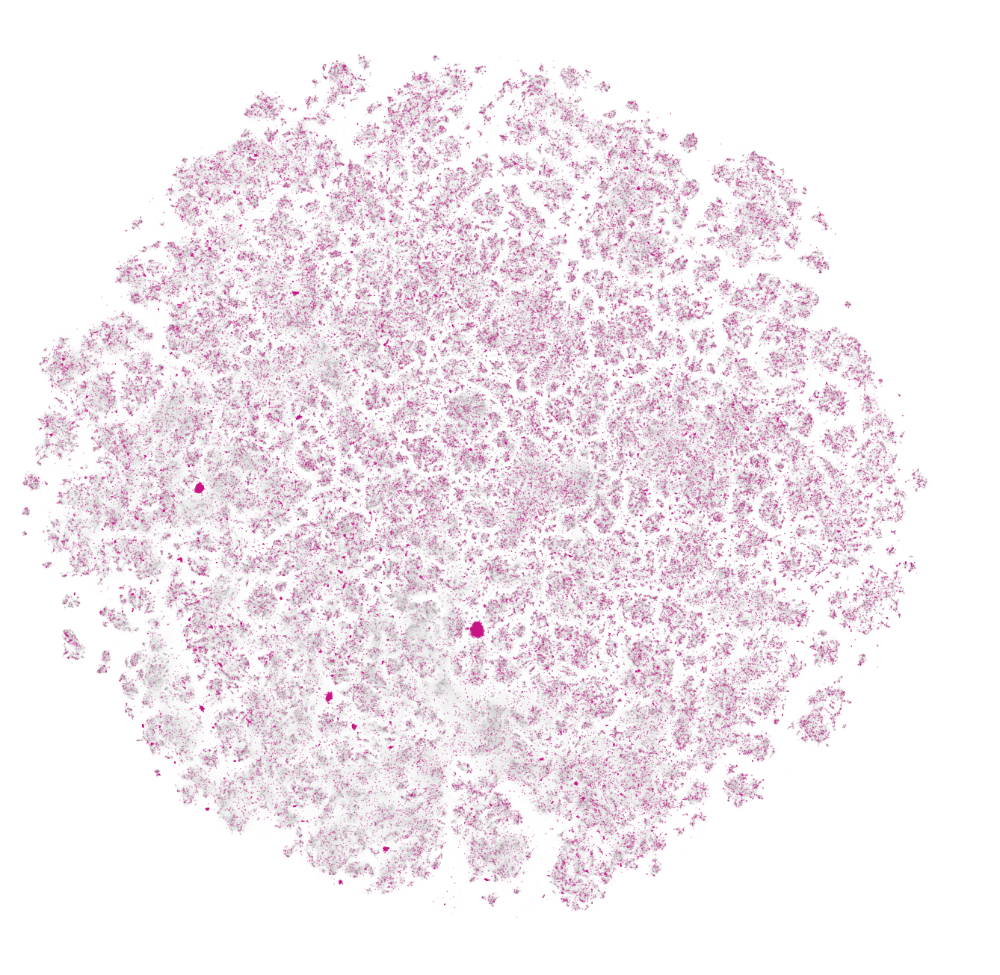

In [25]:
%matplotlib inline 
np.random.seed(42)
reorder = np.random.permutation(tsne_tfidf_covid_keywords_shuffled.shape[0])

tsne=tsne_tfidf_covid_keywords_shuffled
subregion=tsne[mask_covid_2[reorder]]

fig, ax=plt.subplots(figsize=(5.5, 5.5), dpi=300)
ax.scatter(tsne[:,0],tsne[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
ax.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
ax.axis('equal')
ax.set_xlim(left=-200)
ax.set_ylim(-200,200)
ax.axis('off')

fig.savefig(figures_path / "tsne_tfidf_reparsed_covid_keywords_shuffled_shuffled_points.png")

### Exploration pink islands

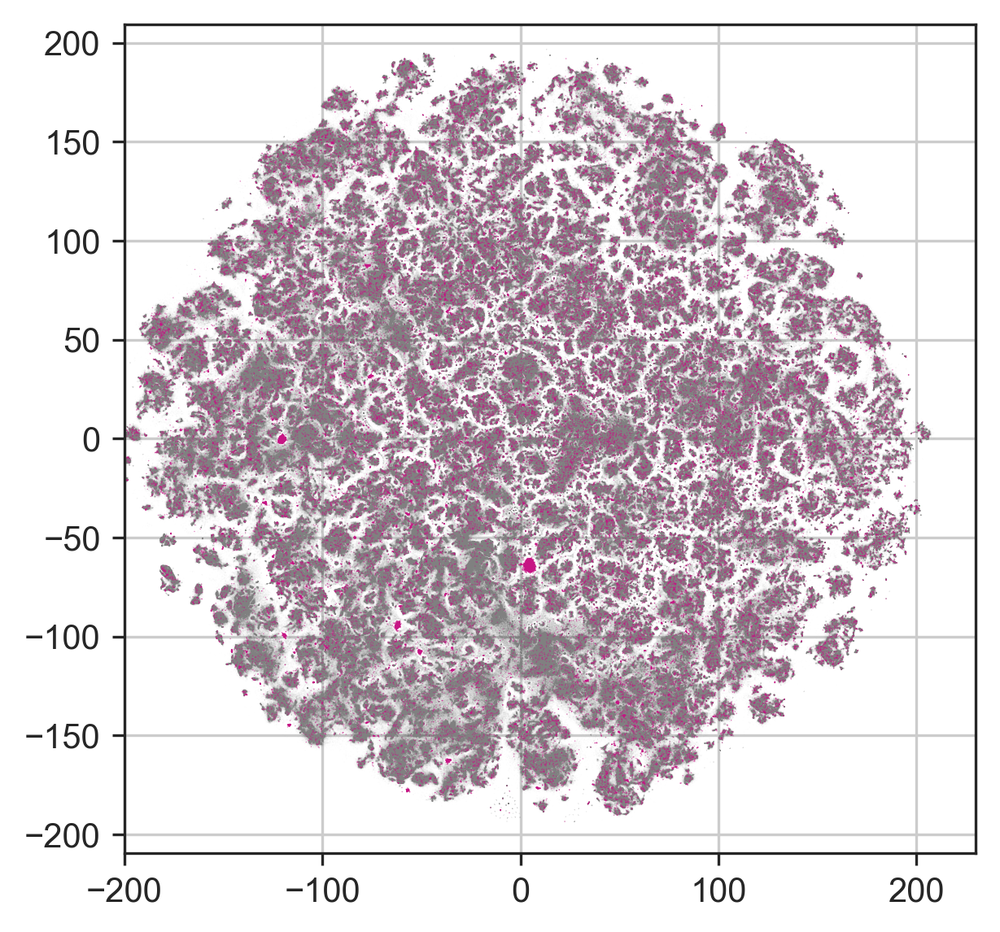

In [28]:
%matplotlib inline 
tsne=tsne_tfidf_covid_keywords_shuffled
subregion=tsne[mask_shuffled_points]

fig=plt.figure(figsize=(4.5, 4.5), dpi=300)
plt.scatter(tsne[:,0],tsne[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
plt.scatter(subregion[:,0], subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
plt.axis('equal')
plt.xlim(left=-200)
plt.ylim(-200,200)
plt.grid()

(-70.0, -60.0)

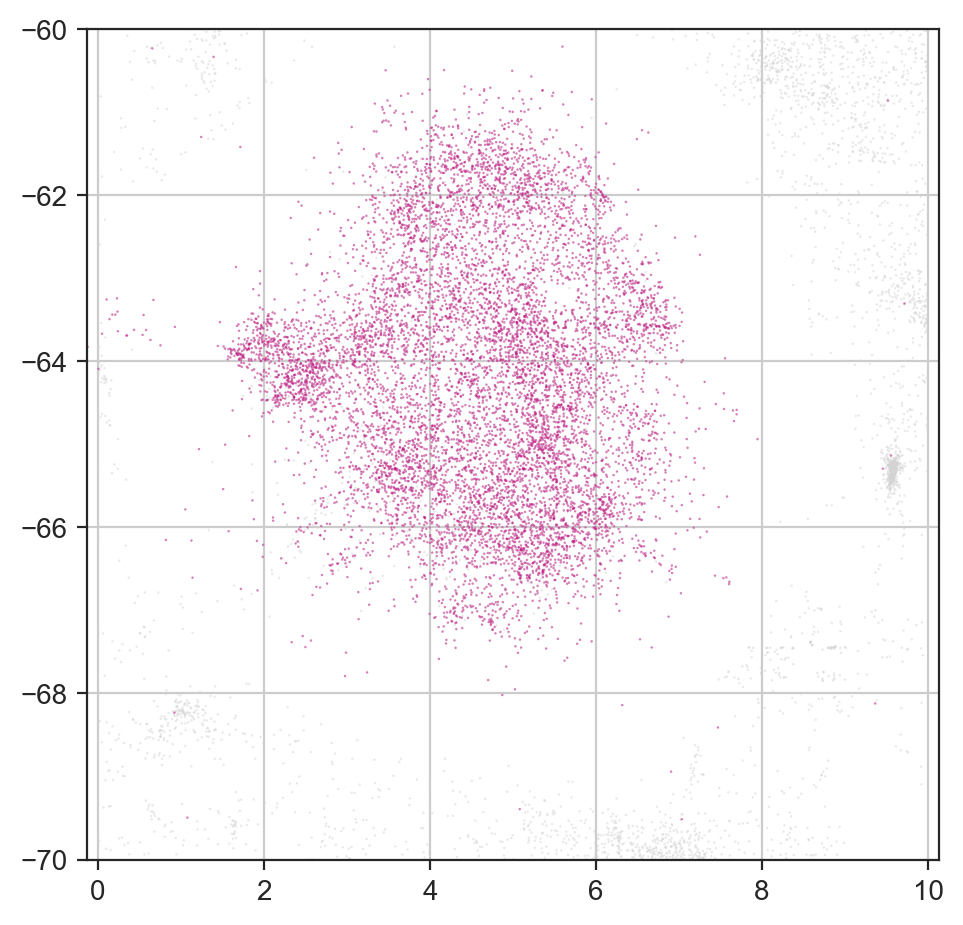

In [32]:
#Plot 
%matplotlib inline 

fig1 =plt.figure(figsize=(5.5, 5.5),dpi=200)

tsne=tsne_tfidf_covid_keywords_shuffled

right=10
left=0
top=-60
bottom=-70
mask_colors = (tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom) 

subregion=tsne[mask_shuffled_points]


# plot
plt.scatter(tsne[mask_colors,0],tsne[mask_colors,1],s=3,c='lightgrey', alpha=0.5, marker='.',linewidths=None, ec='None', rasterized=True)
plt.scatter(subregion[:,0], subregion[:,1],3,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
plt.axis('equal')
plt.grid()
plt.xlim(left, right)
plt.ylim(bottom, top)

In [33]:
#mask island 1
tsne=tsne_tfidf_covid_keywords_shuffled
right=10
left=0
top=-60
bottom=-70
mask_middle_pink_island=(tsne[:,0]<right) & (tsne[:,0]>left) & (tsne[:,1]<top) & (tsne[:,1]>bottom)

In [37]:
# voc
pickle_in = open(variables_path / "vocabulary_updated_reparsed.pkl","rb")
vocabulary_updated_reparsed = pickle.load(pickle_in)

In [38]:
# define vocabulary swap
vocabulary_swap = {value:key for key, value in vocabulary_updated_reparsed.items()}

In [39]:
%%time

tfidf_features_reduced=tfidf_features_covid_keywords_shuffled[mask_middle_pink_island,:]
print('There are {} papers.'.format(tfidf_features_reduced.shape[0]))
tfidf_nonzero=sp.sparse.find(tfidf_features_reduced)
nonzero_elem=np.array(list(zip(tfidf_nonzero[0], tfidf_nonzero[1], tfidf_nonzero[2])))

threshold=np.arange(0.05,0.25,0.05)
# threshold=np.hstack((np.arange(0.01,0.05,0.01),np.arange(0.05,0.9,0.05)))
for i, th in enumerate(threshold):
    mask=nonzero_elem[:,2]>=th
    greater_elem=nonzero_elem[mask]

    rows=greater_elem[:,0]
    unique_rows=np.unique(rows)
    print('In this threshold there are {} papers.'.format(len(unique_rows)))
    
    columns=greater_elem[:,1]
    unique_columns,count_columns=np.unique(columns,return_counts=True)


    sorted_counts_indeces=np.flip(np.argsort(count_columns))
    sorted_columns=np.take_along_axis(unique_columns,sorted_counts_indeces,0)
    sorted_counts=np.flip(np.sort(count_columns))
    print('For threshold = {:.2f}'.format(th),sorted_counts[:30])    
    
    if sorted_columns.size > 0:
        words=np.vectorize(vocabulary_swap.get)(sorted_columns[:30])
        print('For threshold = {:.2f}'.format(th),words)
    

There are 12914 papers.
In this threshold there are 12914 papers.
For threshold = 0.05 [9403 9403 5385 4816 4707 4128 3754 2253 1846 1483 1222 1111 1031 1004
  990  946  884  870  870  868  865  833  819  807  800  797  783  782
  779  775]
For threshold = 0.05 ['covid' '19' 'coronavirus' 'sars' 'cov' '2019' 'the' 'of' 'exposure'
 'dose' 'are' 'species' 'is' 'and' 'exposed' 'we' 'model' 'it' 'can' 'use'
 'data' 'response' 'levels' 'clinical' 'as' 'were' 'be' 'patients'
 'during' 'in']
In this threshold there are 12914 papers.
For threshold = 0.10 [8876 7666 4050 3977 3346 1289  995  945  396  395  389  385  367  322
  293  278  275  275  270  263  260  254  250  247  226  195  187  178
  166  162]
For threshold = 0.10 ['covid' '19' 'sars' 'cov' 'coronavirus' '2019' 'dose' 'exposure'
 'exposed' 'radiation' 'species' 'toxicity' 'design' 'dna' 'phase' 'doses'
 'trials' 'damage' 'workers' 'response' 'uv' 'skin' 'trial' 'designs'
 'model' 'finding' 'oxidative' 'bayesian' 'article' 'efficacy

In [41]:
%%time

tfidf_features_reduced=tfidf_features_updated_reparsed[mask_middle_pink_island,:]
print('There are {} papers.'.format(tfidf_features_reduced.shape[0]))
tfidf_nonzero=sp.sparse.find(tfidf_features_reduced)
nonzero_elem=np.array(list(zip(tfidf_nonzero[0], tfidf_nonzero[1], tfidf_nonzero[2])))

threshold=np.arange(0.05,0.25,0.05)
# threshold=np.hstack((np.arange(0.01,0.05,0.01),np.arange(0.05,0.9,0.05)))
for i, th in enumerate(threshold):
    mask=nonzero_elem[:,2]>=th
    greater_elem=nonzero_elem[mask]

    rows=greater_elem[:,0]
    unique_rows=np.unique(rows)
    print('In this threshold there are {} papers.'.format(len(unique_rows)))
    
    columns=greater_elem[:,1]
    unique_columns,count_columns=np.unique(columns,return_counts=True)


    sorted_counts_indeces=np.flip(np.argsort(count_columns))
    sorted_columns=np.take_along_axis(unique_columns,sorted_counts_indeces,0)
    sorted_counts=np.flip(np.sort(count_columns))
    print('For threshold = {:.2f}'.format(th),sorted_counts[:30])    
    
    if sorted_columns.size > 0:
        words=np.vectorize(vocabulary_swap.get)(sorted_columns[:30])
        print('For threshold = {:.2f}'.format(th),words)
    

There are 12914 papers.
In this threshold there are 12914 papers.
For threshold = 0.05 [3754 2253 1846 1483 1222 1111 1031 1004  990  946  884  870  870  868
  865  833  819  807  800  797  783  782  779  775  769  752  750  749
  743  743]
For threshold = 0.05 ['the' 'of' 'exposure' 'dose' 'are' 'species' 'is' 'and' 'exposed' 'we'
 'model' 'can' 'it' 'use' 'data' 'response' 'levels' 'clinical' 'as'
 'were' 'be' 'patients' 'during' 'in' 'design' 'new' 'their' 'have' 'has'
 'may']
In this threshold there are 12914 papers.
For threshold = 0.10 [995 945 396 395 389 385 367 322 293 278 275 275 270 263 260 254 250 247
 226 195 187 178 166 162 162 162 155 152 151 147]
For threshold = 0.10 ['dose' 'exposure' 'exposed' 'radiation' 'species' 'toxicity' 'design'
 'dna' 'phase' 'doses' 'trials' 'damage' 'workers' 'response' 'uv' 'skin'
 'trial' 'designs' 'model' 'finding' 'oxidative' 'bayesian' 'article'
 'subjects' 'efficacy' 'stress' 'mtd' 'light' 'exposures' 'blood']
In this threshold there ar

### Shuffled points in unaltered TF-IDF embedding

In [42]:
tsne_tfidf_reparsed=np.load(variables_path / "tsne_tfidf_reparsed.npy")

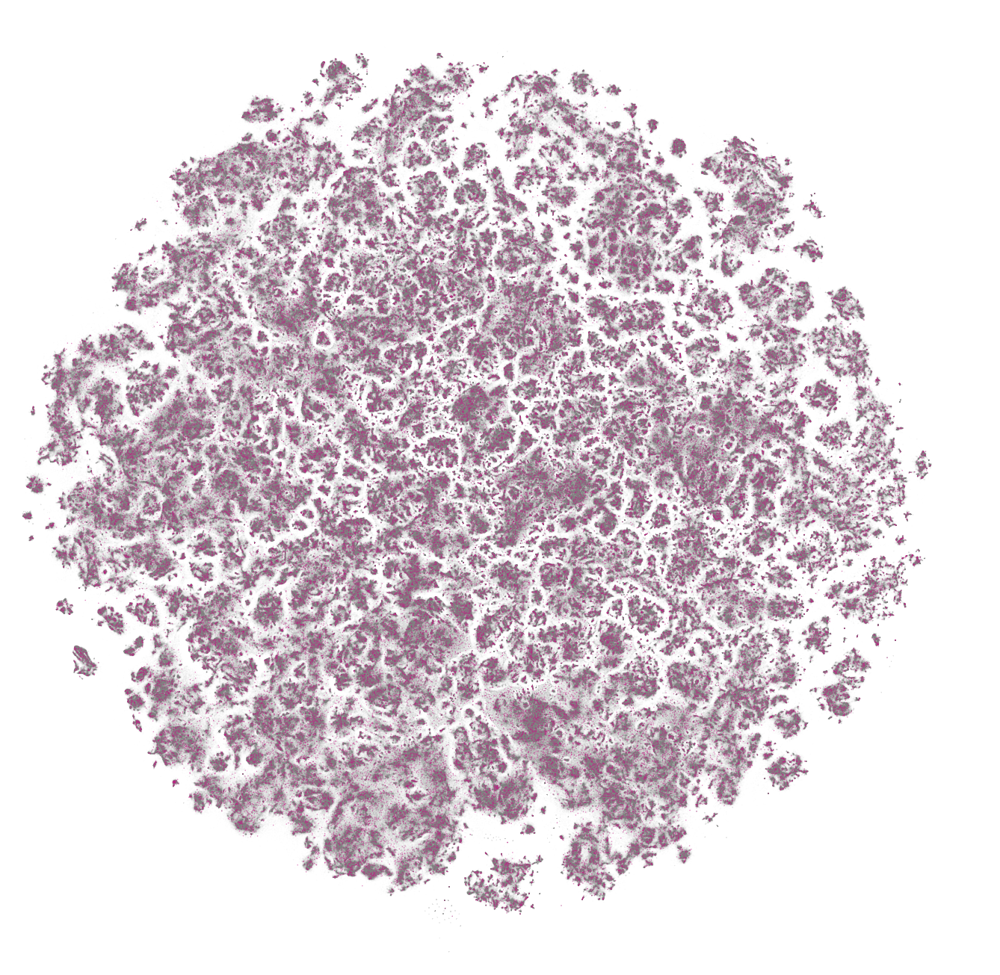

In [43]:
%matplotlib inline 
tsne=tsne_tfidf_reparsed
subregion=tsne[mask_shuffled_points]

fig=plt.figure(figsize=(5.5, 5.5), dpi=300)
plt.scatter(tsne[:,0],tsne[:,1],s=0.5,c='grey',marker='.',linewidths=None,ec='None', alpha=0.01, rasterized=True)
plt.scatter(subregion[:,0],subregion[:,1],s=0.5,c='mediumvioletred',alpha=0.5, marker='.',linewidths=None,ec='None')
plt.axis('equal')
plt.xlim(left=-200)
plt.ylim(-200,200)
plt.grid()
plt.xticks([])
plt.yticks([])
sns.despine(bottom=True, left=True)

plt.savefig(figures_path / "tsne_tfidf_reparsed_shuffled_points.png", bbox_inches='tight')